# Data from the Norwegian young sea-ICE (N-ICE) cruise

<b><u>REQUIREMENTS FOR USE:</u></b>  <b><i>The N-ICE Atmospheric Forcing work package team requests that users of these data: 1) Contact both  Stephen Hudson (Stephen.Hudson@npolar.no) and Lana Cohen (Lana.Cohen@npolar.no) to discuss your specific uses of the data, and 2) Include the requested_acknowledgment in any presentations or publications.</i></b>

<b><u>REQUESTED ACKNOWLEDGMENT:</u></b>  <b><i>The authors acknowledge support from Stephen Hudson and Lana Cohen at the Norwegian Polar Institute and Von P. Walden at Washington State University for use of the N-ICE2015 dataset.</i></b>

In [16]:
%pylab inline

Populating the interactive namespace from numpy and matplotlib


Exception AttributeError: "'netcdf_file' object has no attribute 'fp'" in <bound method netcdf_file.close of <scipy.io.netcdf.netcdf_file object at 0x7f3274558690>> ignored


In [42]:
from scipy.io import netcdf_file
from datetime import datetime
from bokeh.plotting import figure, output_notebook, show, vplot


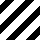
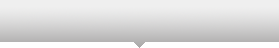
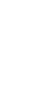
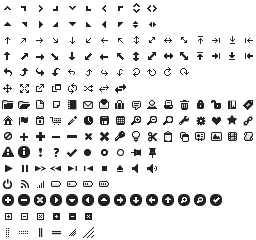
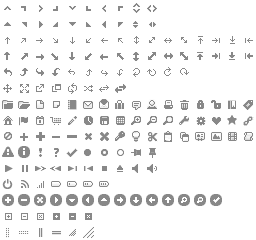
...
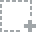
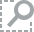
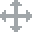
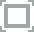
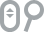

In [43]:
output_notebook()

## Meteorological Data (10-m tower)

In [ ]:
met   = netcdf_file('/home/hub-vonw/Short Course on Atmospheric Radiative Transfer/content/data/N-ICE_metData_v1.nc')
mtime = [datetime(int(t[0]),int(t[1]),int(t[2]),int(t[3]),int(t[4]),int(t[5])) for t in zip(met.variables['year'][:],met.variables['month'][:],met.variables['day'][:],met.variables['hour'][:],met.variables['minute'][:],met.variables['second'][:])]

mp1 = figure(plot_width=1000,plot_height=200,x_axis_type='datetime')
mp1.line(mtime,met.variables['air_pressure_at_sea_level'][:])

mp2 = figure(plot_width=1000,plot_height=200,x_axis_type='datetime',x_range=mp1.x_range)
mp2.line(mtime,met.variables['air_temperature_2m'][:]-273.15)

mp3 = figure(plot_width=1000,plot_height=200,x_axis_type='datetime',x_range=mp1.x_range)
mp3.line(mtime,met.variables['relative_humidity_2m'][:])

mp4 = figure(plot_width=1000,plot_height=200,x_axis_type='datetime',x_range=mp1.x_range)
mp4.line(mtime,met.variables['wind_speed_2m'][:])

In [ ]:
p = vplot(mp1, mp2, mp3, mp4)

show(p)

## Surface Radiation

In [39]:
rad = netcdf_file('/home/hub-vonw/Short Course on Atmospheric Radiative Transfer/content/data/N-ICE_sfcRadiation_PRELIMINARY.nc')
rtime = [datetime(int(t[0]),int(t[1]),int(t[2]),int(t[3]),int(t[4]),int(t[5])) for t in zip(rad.variables['year'][:],rad.variables['month'][:],rad.variables['day'][:],rad.variables['hour'][:],rad.variables['minute'][:],rad.variables['second'][:])]

radplot = figure(plot_width=1000,plot_height=500,x_axis_type='datetime')
radplot.line(rtime, rad.variables['downwelling_shortwave'][:],color='yellow')
radplot.line(rtime,-rad.variables['upwelling_shortwave'][:],  color='red')
radplot.line(rtime, rad.variables['downwelling_longwave'][:], color='navy')
radplot.line(rtime,-rad.variables['upwelling_longwave'][:],   color='darkgreen')

In [40]:
show(radplot)